# Multi-filter response: [185, 232, 62, 127, 21, 74]

MODEL: unit-wnet-wrferaext18-32f-mean0-ose-trainer-3resblks-3ds-bse2-drop2-dr3-ssim-simenc2
gen_00725001.pt


### multi-filter subs


In [2317]:
def calc_filter_variance(input_chunk, bn_mean_era, gen, filters):
    generated_chunk = gen.decode(bn_mean_era).detach().numpy()
    avg_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    avg_decoded_denorm = generated_chunk_denorm[0]

    encoded_extreme = gen.encode(input_chunk)[0].detach()
    generated_chunk = gen.decode(encoded_extreme).detach().numpy()
    front_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    front_decoded_denorm = generated_chunk_denorm[0]

    newbn = bn_mean_era.clone()

    for ff in filters:
        newbn[0, ff, :, :] = encoded_extreme[0, ff, :, :].clone()

    generated_chunk = gen.decode(newbn).detach().numpy()
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk_denorm = generated_chunk_denorm[0]

    err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(front_decoded)).detach())
    err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(front_decoded[ii])).detach())) for ii in range(18)]

    return [err, err18, filters, generated_chunk_denorm - avg_decoded_denorm]

In [2611]:
2

2

In [2804]:
def get_filter_substitutions_minmax(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmax=None, vmin=None):
    vmax = [-9999 for y in range(18)]  
    vmin = [9999 for y in range(18)]           

    for ii in range(stormcount): #range(len(storms)):
        input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
        input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

        xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)

        vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
        vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

        vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
        vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]
        
    return vmin, vmax


# def apply_filter_substitutions(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmin=None, vmax=None):
    
#     for ii in range(stormcount): #range(len(storms)):
#         print('\nSTORM INDEX:', ii)
#         input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
#         input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

#         xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)
#         print(np.array(xx[3]).shape)

#         if vmax == None or vmin == None:
#             vmax = [-9999 for y in range(18)]  
#             vmin = [9999 for y in range(18)]           
#             vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
#             vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

#             vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
#             vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]

#         print("FILTERS", filters)
#         svars = [0, 1, 2, 3, 4, 5, 6, 7, 8]
#         plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
#         svars = [9, 10, 11, 12, 13, 14, 15, 16, 17]
#         plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        
#     return vmin, vmax


def apply_filter_substitutions(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmin=None, vmax=None):
    
    original_ranges = []  # Store the original ranges for each variable
    
    for ii in range(stormcount):
        print('\nSTORM INDEX:', ii)
        input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
        input_chunk[np.isnan(input_chunk)] = 0.
        
        xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)
        print(np.array(xx[3]).shape)
        
        if vmax is None or vmin is None:
            vmax = [-9999 for _ in range(18)]
            vmin = [9999 for _ in range(18)]
            vmin_temp = [xx[3][ii].mean() - xx[3][ii].std() * 2 for ii in range(18)]
            vmax_temp = [xx[3][ii].mean() + xx[3][ii].std() * 2 for ii in range(18)]
            
            vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
            vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]
        
        # Calculate the original range for each variable (channel)
        for var_idx in range(18):
            original_range = torch.max(input_chunk[:, var_idx, :, :]) - torch.min(input_chunk[:, var_idx, :, :])
            original_ranges.append(original_range)
        
        print("FILTERS", filters)
        svars = [0, 1, 2, 3, 4, 5, 6, 7, 8]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        svars = [9, 10, 11, 12, 13, 14, 15, 16, 17]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        
           
        # Calculate and print % differences per day and per variable
        for var_idx in range(18):
            percentage_diff = (input_chunk[0, var_idx, :, :] / original_ranges[var_idx]) * 100
            avg_percentage_diff = torch.mean(percentage_diff).item()  # Calculate the average percentage difference
            print(f"Day {ii}, Variable {var_idx}: Avg % Difference: {avg_percentage_diff:.2f}")
            
            
        # Create a bar plot
        avg_percentage_diffs = []
        for var_idx in range(18):
            percentage_diff = (input_chunk[0, var_idx, :, :] / original_ranges[var_idx]) * 100
            avg_percentage_diff = torch.mean(percentage_diff).item()
            avg_percentage_diffs.append(avg_percentage_diff)
            
        plt.figure(figsize=(10, 6))
        variable_names = [f"Variable {var_idx}" for var_idx in range(18)]
        plt.barh(variable_names, avg_percentage_diffs, color='skyblue')
        plt.xlabel('Avg % Difference')
        plt.ylabel('Variable')
        plt.title('Average % Difference for Each Variable')
        plt.tight_layout()
        plt.show()

        
    original_ranges = torch.stack(original_ranges)
    
    return vmin, vmax, original_ranges

In [2805]:
storms.shape

torch.Size([26, 18, 192, 256])

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys



STORM INDEX: 0


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


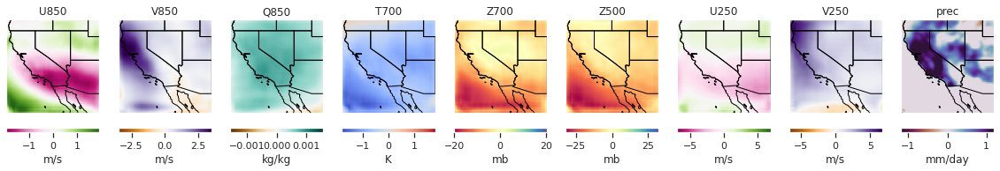

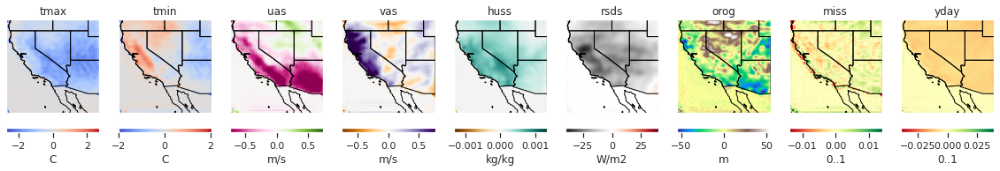

Day 0, Variable 0: Avg % Difference: -6.25
Day 0, Variable 1: Avg % Difference: 19.91
Day 0, Variable 2: Avg % Difference: -1.79
Day 0, Variable 3: Avg % Difference: 12.23
Day 0, Variable 4: Avg % Difference: 21.18
Day 0, Variable 5: Avg % Difference: 17.48
Day 0, Variable 6: Avg % Difference: 43.42
Day 0, Variable 7: Avg % Difference: 29.02
Day 0, Variable 8: Avg % Difference: 21.11
Day 0, Variable 9: Avg % Difference: 44.42
Day 0, Variable 10: Avg % Difference: 43.44
Day 0, Variable 11: Avg % Difference: 27.64
Day 0, Variable 12: Avg % Difference: 42.85
Day 0, Variable 13: Avg % Difference: 20.37
Day 0, Variable 14: Avg % Difference: 15.89
Day 0, Variable 15: Avg % Difference: 19.78
Day 0, Variable 16: Avg % Difference: 62.04
Day 0, Variable 17: Avg % Difference: 55.72


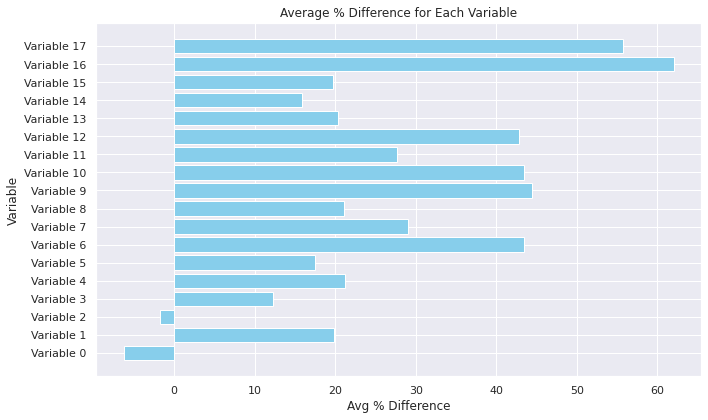


STORM INDEX: 1


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


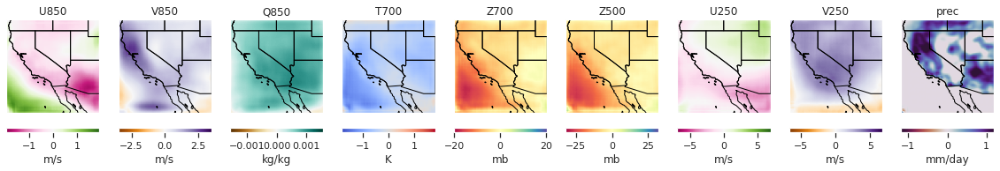

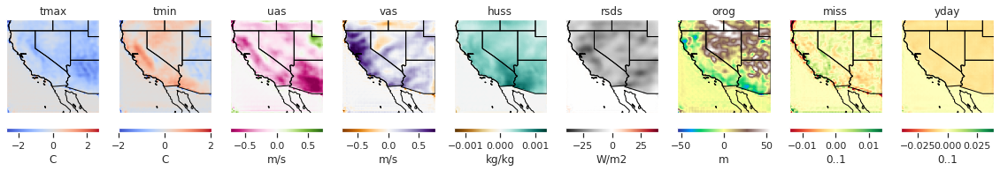

Day 1, Variable 0: Avg % Difference: 5.98
Day 1, Variable 1: Avg % Difference: 22.06
Day 1, Variable 2: Avg % Difference: 9.89
Day 1, Variable 3: Avg % Difference: 3.94
Day 1, Variable 4: Avg % Difference: -1.97
Day 1, Variable 5: Avg % Difference: 3.52
Day 1, Variable 6: Avg % Difference: 33.25
Day 1, Variable 7: Avg % Difference: 35.96
Day 1, Variable 8: Avg % Difference: 22.67
Day 1, Variable 9: Avg % Difference: 45.34
Day 1, Variable 10: Avg % Difference: 46.14
Day 1, Variable 11: Avg % Difference: 26.68
Day 1, Variable 12: Avg % Difference: 40.74
Day 1, Variable 13: Avg % Difference: 26.46
Day 1, Variable 14: Avg % Difference: 7.56
Day 1, Variable 15: Avg % Difference: 19.78
Day 1, Variable 16: Avg % Difference: 62.04
Day 1, Variable 17: Avg % Difference: 55.72


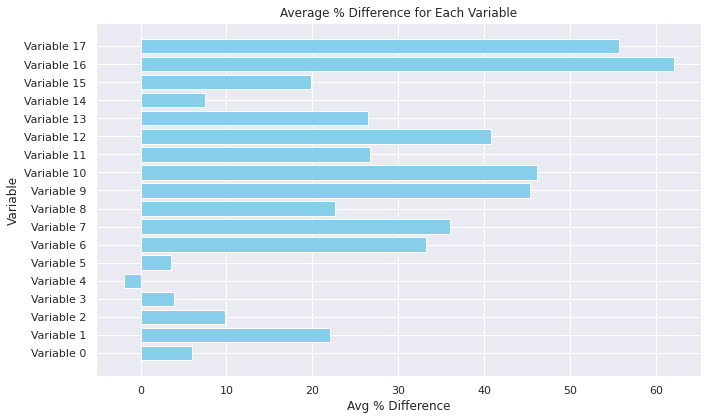


STORM INDEX: 2


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


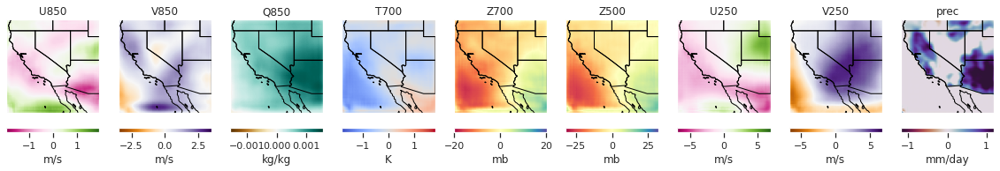

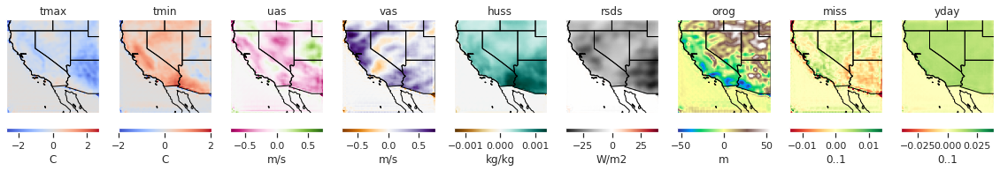

Day 2, Variable 0: Avg % Difference: 10.35
Day 2, Variable 1: Avg % Difference: 14.87
Day 2, Variable 2: Avg % Difference: 14.48
Day 2, Variable 3: Avg % Difference: 1.79
Day 2, Variable 4: Avg % Difference: 1.83
Day 2, Variable 5: Avg % Difference: 1.46
Day 2, Variable 6: Avg % Difference: 23.65
Day 2, Variable 7: Avg % Difference: 33.82
Day 2, Variable 8: Avg % Difference: 13.81
Day 2, Variable 9: Avg % Difference: 46.71
Day 2, Variable 10: Avg % Difference: 45.12
Day 2, Variable 11: Avg % Difference: 30.53
Day 2, Variable 12: Avg % Difference: 47.78
Day 2, Variable 13: Avg % Difference: 30.83
Day 2, Variable 14: Avg % Difference: 17.08
Day 2, Variable 15: Avg % Difference: 19.78
Day 2, Variable 16: Avg % Difference: 62.04
Day 2, Variable 17: Avg % Difference: 55.72


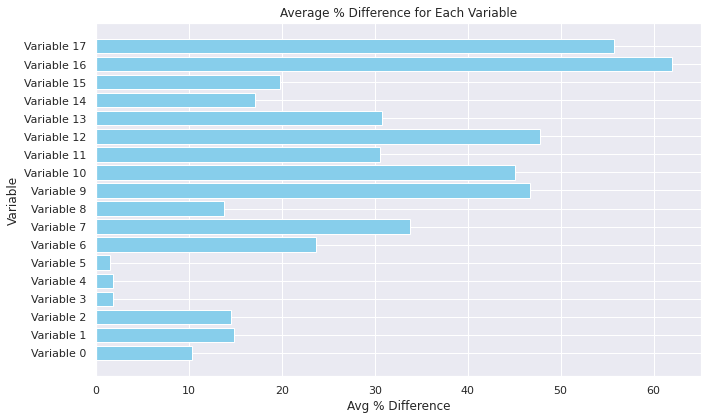


STORM INDEX: 3


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


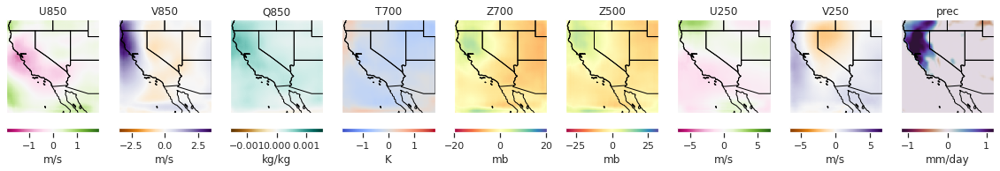

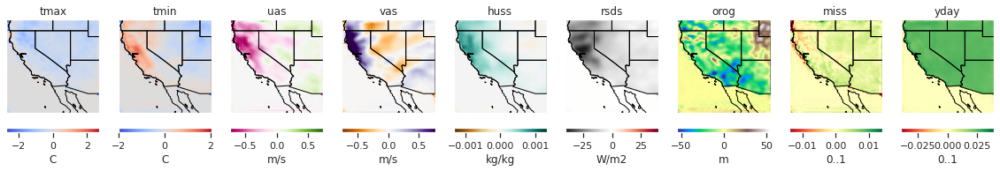

Day 3, Variable 0: Avg % Difference: -3.47
Day 3, Variable 1: Avg % Difference: 12.59
Day 3, Variable 2: Avg % Difference: 9.53
Day 3, Variable 3: Avg % Difference: 2.20
Day 3, Variable 4: Avg % Difference: 18.89
Day 3, Variable 5: Avg % Difference: 9.92
Day 3, Variable 6: Avg % Difference: 24.32
Day 3, Variable 7: Avg % Difference: 15.81
Day 3, Variable 8: Avg % Difference: 5.17
Day 3, Variable 9: Avg % Difference: 46.65
Day 3, Variable 10: Avg % Difference: 44.59
Day 3, Variable 11: Avg % Difference: 29.16
Day 3, Variable 12: Avg % Difference: 43.53
Day 3, Variable 13: Avg % Difference: 27.29
Day 3, Variable 14: Avg % Difference: 25.82
Day 3, Variable 15: Avg % Difference: 19.78
Day 3, Variable 16: Avg % Difference: 62.04
Day 3, Variable 17: Avg % Difference: 55.72


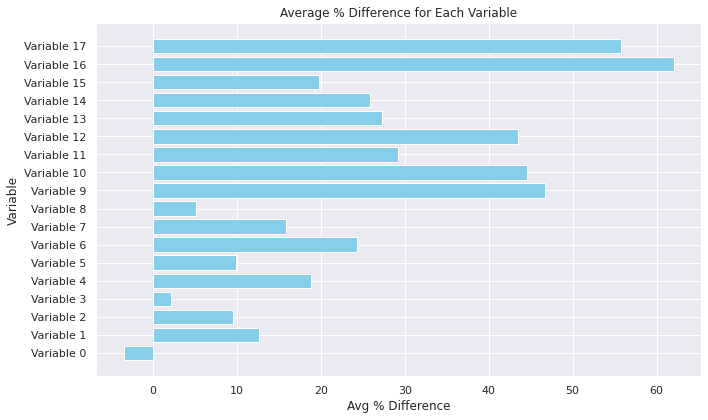


STORM INDEX: 4


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


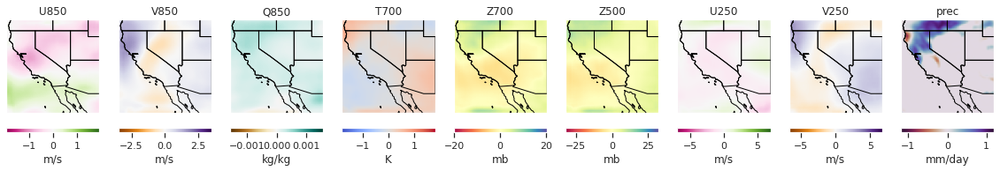

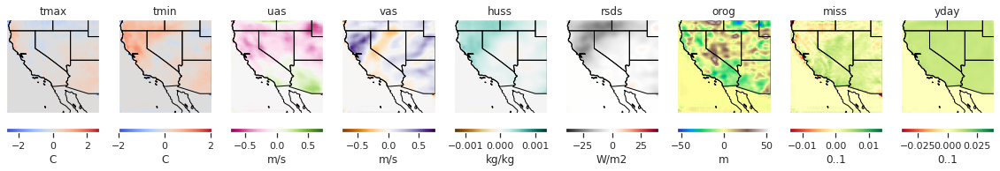

Day 4, Variable 0: Avg % Difference: -2.91
Day 4, Variable 1: Avg % Difference: 10.06
Day 4, Variable 2: Avg % Difference: 4.10
Day 4, Variable 3: Avg % Difference: -0.59
Day 4, Variable 4: Avg % Difference: 36.60
Day 4, Variable 5: Avg % Difference: 17.87
Day 4, Variable 6: Avg % Difference: 13.55
Day 4, Variable 7: Avg % Difference: 21.83
Day 4, Variable 8: Avg % Difference: 3.00
Day 4, Variable 9: Avg % Difference: 47.99
Day 4, Variable 10: Avg % Difference: 43.79
Day 4, Variable 11: Avg % Difference: 28.72
Day 4, Variable 12: Avg % Difference: 45.19
Day 4, Variable 13: Avg % Difference: 26.88
Day 4, Variable 14: Avg % Difference: 22.36
Day 4, Variable 15: Avg % Difference: 19.78
Day 4, Variable 16: Avg % Difference: 62.04
Day 4, Variable 17: Avg % Difference: 55.72


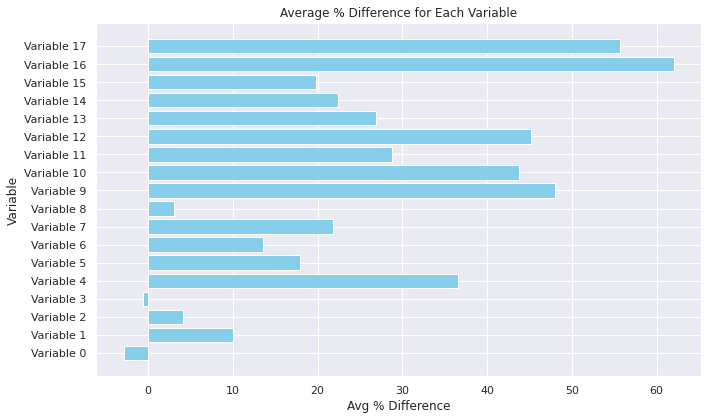


STORM INDEX: 5


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


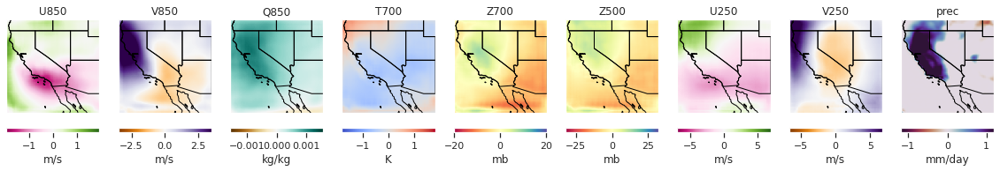

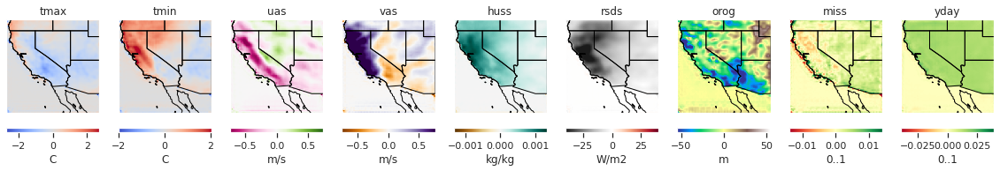

Day 5, Variable 0: Avg % Difference: 3.90
Day 5, Variable 1: Avg % Difference: 25.09
Day 5, Variable 2: Avg % Difference: -8.59
Day 5, Variable 3: Avg % Difference: 21.13
Day 5, Variable 4: Avg % Difference: 1.06
Day 5, Variable 5: Avg % Difference: 10.96
Day 5, Variable 6: Avg % Difference: 9.84
Day 5, Variable 7: Avg % Difference: 0.15
Day 5, Variable 8: Avg % Difference: 12.51
Day 5, Variable 9: Avg % Difference: 48.39
Day 5, Variable 10: Avg % Difference: 45.21
Day 5, Variable 11: Avg % Difference: 27.20
Day 5, Variable 12: Avg % Difference: 38.87
Day 5, Variable 13: Avg % Difference: 21.00
Day 5, Variable 14: Avg % Difference: 20.48
Day 5, Variable 15: Avg % Difference: 19.78
Day 5, Variable 16: Avg % Difference: 62.04
Day 5, Variable 17: Avg % Difference: 55.72


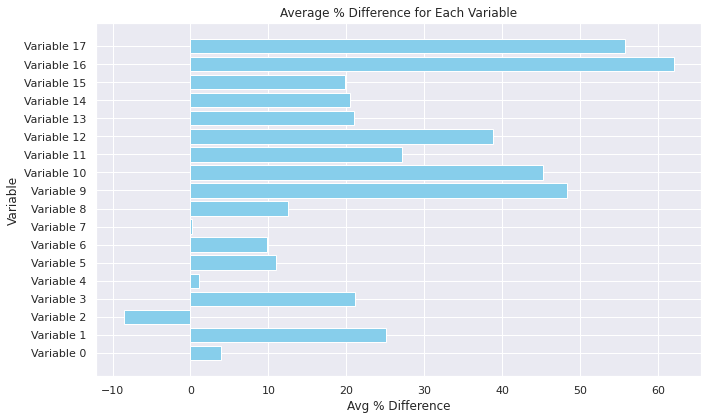


STORM INDEX: 6


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


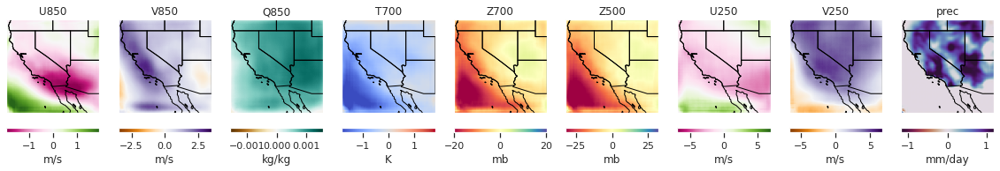

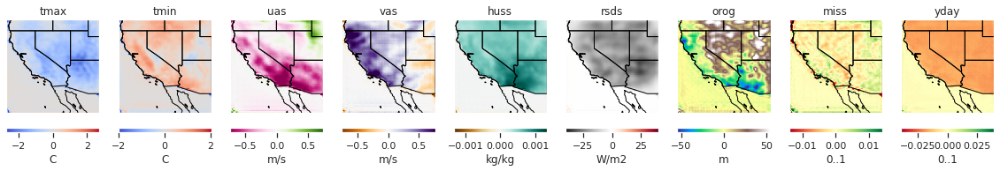

Day 6, Variable 0: Avg % Difference: 8.47
Day 6, Variable 1: Avg % Difference: 25.17
Day 6, Variable 2: Avg % Difference: -4.43
Day 6, Variable 3: Avg % Difference: -1.40
Day 6, Variable 4: Avg % Difference: -22.19
Day 6, Variable 5: Avg % Difference: -10.81
Day 6, Variable 6: Avg % Difference: 4.06
Day 6, Variable 7: Avg % Difference: 41.85
Day 6, Variable 8: Avg % Difference: 22.55
Day 6, Variable 9: Avg % Difference: 45.43
Day 6, Variable 10: Avg % Difference: 43.47
Day 6, Variable 11: Avg % Difference: 28.48
Day 6, Variable 12: Avg % Difference: 38.00
Day 6, Variable 13: Avg % Difference: 21.38
Day 6, Variable 14: Avg % Difference: 18.29
Day 6, Variable 15: Avg % Difference: 19.78
Day 6, Variable 16: Avg % Difference: 62.04
Day 6, Variable 17: Avg % Difference: 55.72


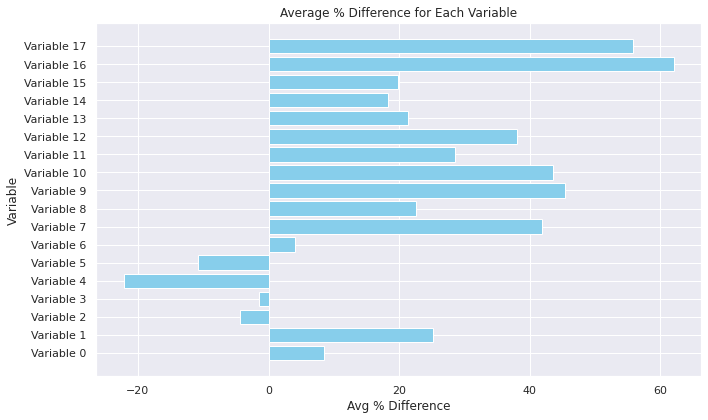


STORM INDEX: 7


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


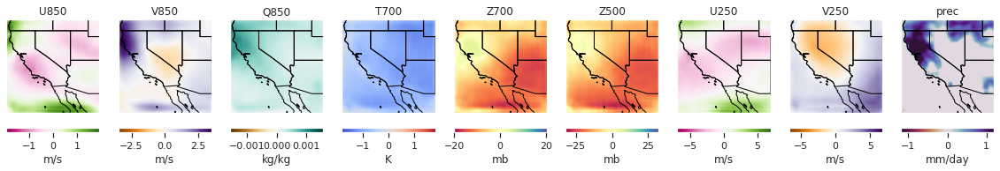

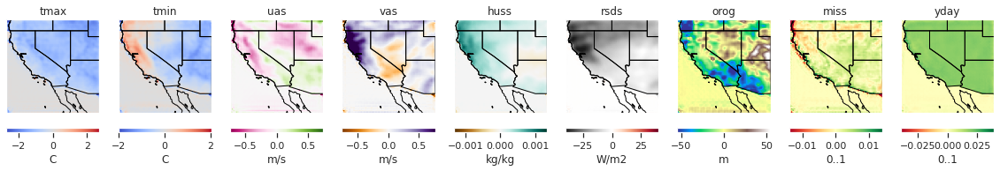

Day 7, Variable 0: Avg % Difference: 25.31
Day 7, Variable 1: Avg % Difference: -9.10
Day 7, Variable 2: Avg % Difference: -36.77
Day 7, Variable 3: Avg % Difference: -63.51
Day 7, Variable 4: Avg % Difference: -55.06
Day 7, Variable 5: Avg % Difference: -60.57
Day 7, Variable 6: Avg % Difference: 46.56
Day 7, Variable 7: Avg % Difference: -45.76
Day 7, Variable 8: Avg % Difference: 13.89
Day 7, Variable 9: Avg % Difference: 35.06
Day 7, Variable 10: Avg % Difference: 29.06
Day 7, Variable 11: Avg % Difference: 38.39
Day 7, Variable 12: Avg % Difference: 51.27
Day 7, Variable 13: Avg % Difference: 3.85
Day 7, Variable 14: Avg % Difference: 27.48
Day 7, Variable 15: Avg % Difference: 19.78
Day 7, Variable 16: Avg % Difference: 62.04
Day 7, Variable 17: Avg % Difference: 55.72


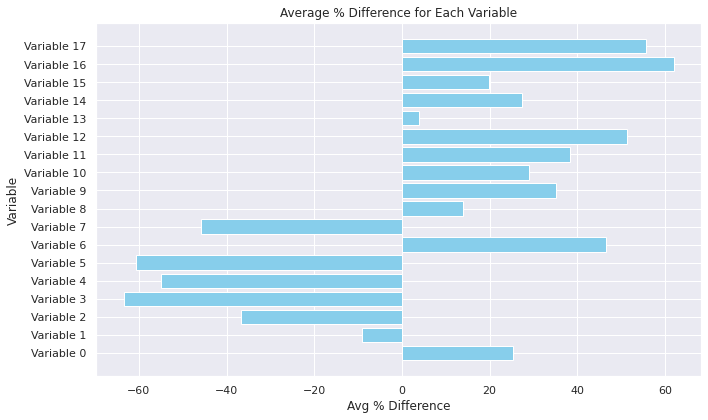


STORM INDEX: 8


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


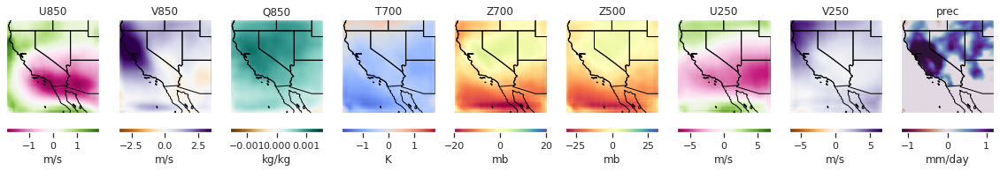

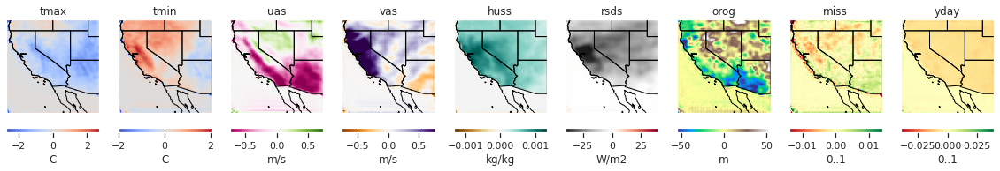

Day 8, Variable 0: Avg % Difference: 14.41
Day 8, Variable 1: Avg % Difference: 18.88
Day 8, Variable 2: Avg % Difference: -34.46
Day 8, Variable 3: Avg % Difference: -31.88
Day 8, Variable 4: Avg % Difference: -22.81
Day 8, Variable 5: Avg % Difference: -23.73
Day 8, Variable 6: Avg % Difference: 59.17
Day 8, Variable 7: Avg % Difference: -27.35
Day 8, Variable 8: Avg % Difference: 23.73
Day 8, Variable 9: Avg % Difference: 37.64
Day 8, Variable 10: Avg % Difference: 32.59
Day 8, Variable 11: Avg % Difference: 31.84
Day 8, Variable 12: Avg % Difference: 60.37
Day 8, Variable 13: Avg % Difference: 9.22
Day 8, Variable 14: Avg % Difference: 14.10
Day 8, Variable 15: Avg % Difference: 19.78
Day 8, Variable 16: Avg % Difference: 62.04
Day 8, Variable 17: Avg % Difference: 55.72


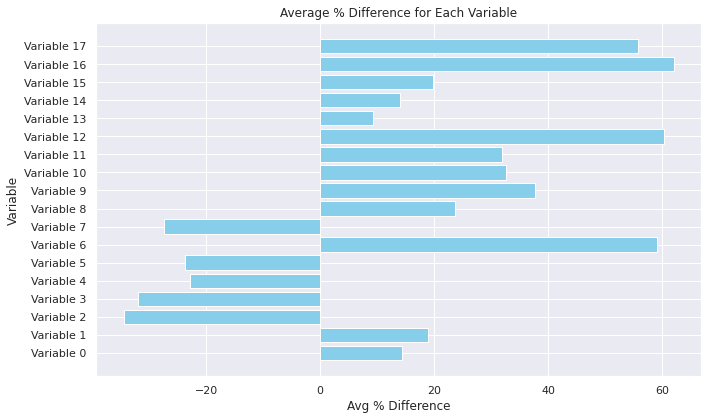


STORM INDEX: 9


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


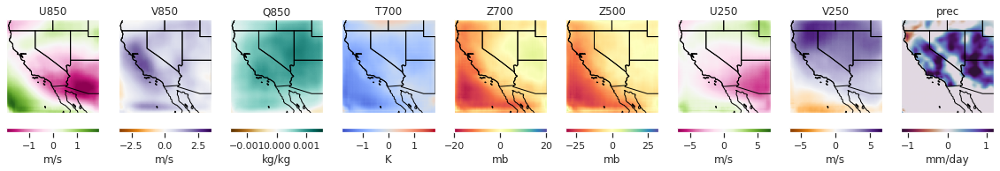

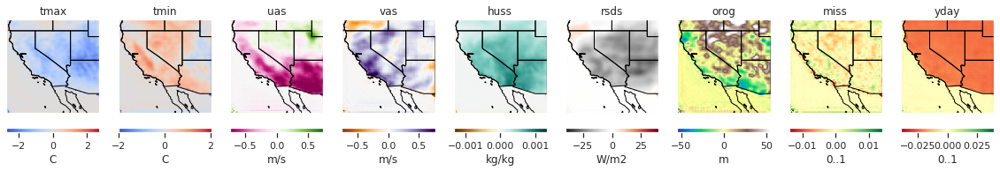

Day 9, Variable 0: Avg % Difference: 29.98
Day 9, Variable 1: Avg % Difference: 11.67
Day 9, Variable 2: Avg % Difference: -19.78
Day 9, Variable 3: Avg % Difference: -22.82
Day 9, Variable 4: Avg % Difference: -42.14
Day 9, Variable 5: Avg % Difference: -31.79
Day 9, Variable 6: Avg % Difference: 54.03
Day 9, Variable 7: Avg % Difference: 17.34
Day 9, Variable 8: Avg % Difference: 18.68
Day 9, Variable 9: Avg % Difference: 38.64
Day 9, Variable 10: Avg % Difference: 34.04
Day 9, Variable 11: Avg % Difference: 34.22
Day 9, Variable 12: Avg % Difference: 54.83
Day 9, Variable 13: Avg % Difference: 12.34
Day 9, Variable 14: Avg % Difference: 13.49
Day 9, Variable 15: Avg % Difference: 19.78
Day 9, Variable 16: Avg % Difference: 62.04
Day 9, Variable 17: Avg % Difference: 55.72


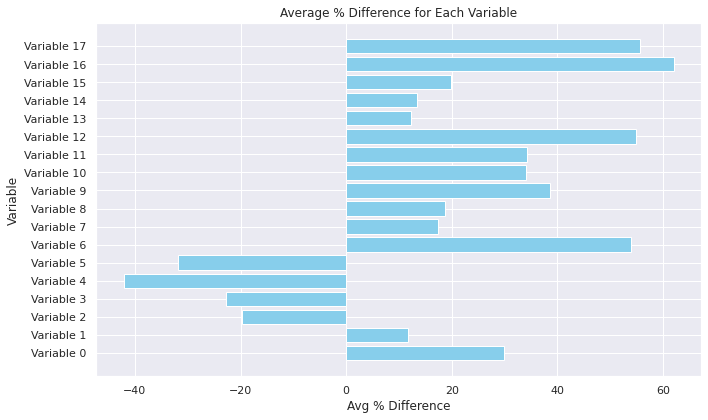


STORM INDEX: 10


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


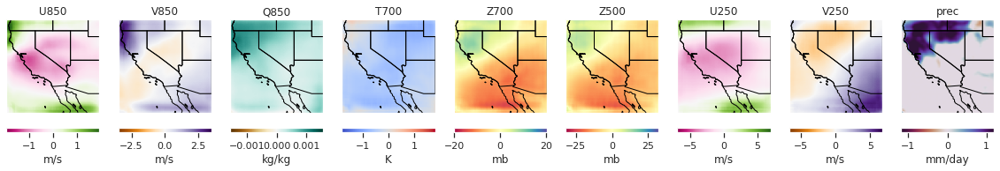

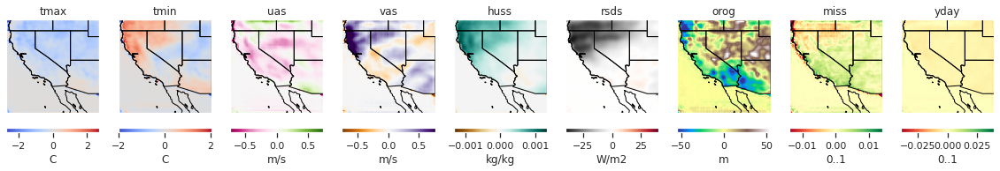

Day 10, Variable 0: Avg % Difference: 3.81
Day 10, Variable 1: Avg % Difference: -8.67
Day 10, Variable 2: Avg % Difference: -34.20
Day 10, Variable 3: Avg % Difference: -19.60
Day 10, Variable 4: Avg % Difference: -20.88
Day 10, Variable 5: Avg % Difference: -10.91
Day 10, Variable 6: Avg % Difference: -10.33
Day 10, Variable 7: Avg % Difference: -43.88
Day 10, Variable 8: Avg % Difference: 10.30
Day 10, Variable 9: Avg % Difference: 40.11
Day 10, Variable 10: Avg % Difference: 34.09
Day 10, Variable 11: Avg % Difference: 31.43
Day 10, Variable 12: Avg % Difference: 54.82
Day 10, Variable 13: Avg % Difference: 5.76
Day 10, Variable 14: Avg % Difference: 33.76
Day 10, Variable 15: Avg % Difference: 19.78
Day 10, Variable 16: Avg % Difference: 62.04
Day 10, Variable 17: Avg % Difference: 55.72


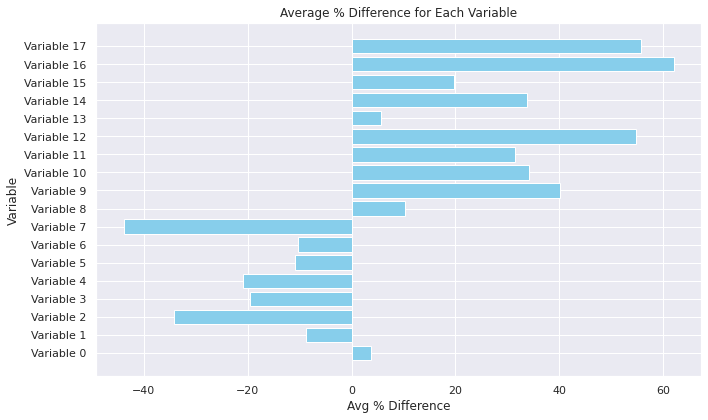


STORM INDEX: 11


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


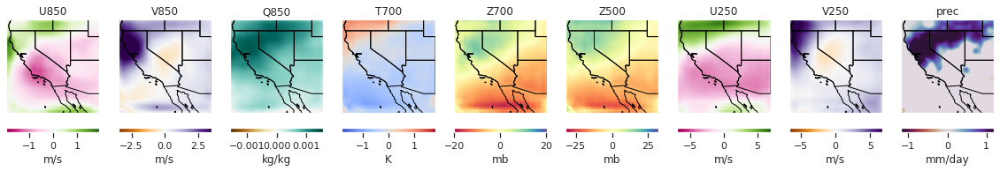

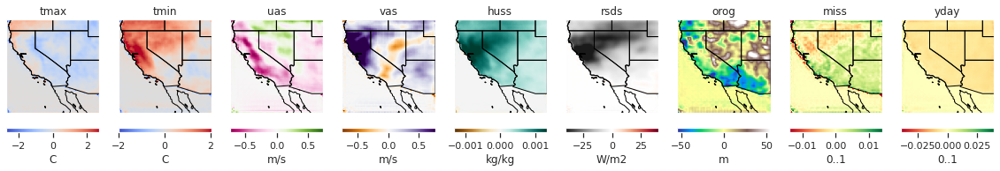

Day 11, Variable 0: Avg % Difference: 1.47
Day 11, Variable 1: Avg % Difference: 5.65
Day 11, Variable 2: Avg % Difference: -29.05
Day 11, Variable 3: Avg % Difference: 11.92
Day 11, Variable 4: Avg % Difference: 0.79
Day 11, Variable 5: Avg % Difference: 12.23
Day 11, Variable 6: Avg % Difference: 26.29
Day 11, Variable 7: Avg % Difference: -16.35
Day 11, Variable 8: Avg % Difference: 14.18
Day 11, Variable 9: Avg % Difference: 44.58
Day 11, Variable 10: Avg % Difference: 38.38
Day 11, Variable 11: Avg % Difference: 29.52
Day 11, Variable 12: Avg % Difference: 54.23
Day 11, Variable 13: Avg % Difference: 12.71
Day 11, Variable 14: Avg % Difference: 32.98
Day 11, Variable 15: Avg % Difference: 19.78
Day 11, Variable 16: Avg % Difference: 62.04
Day 11, Variable 17: Avg % Difference: 55.72


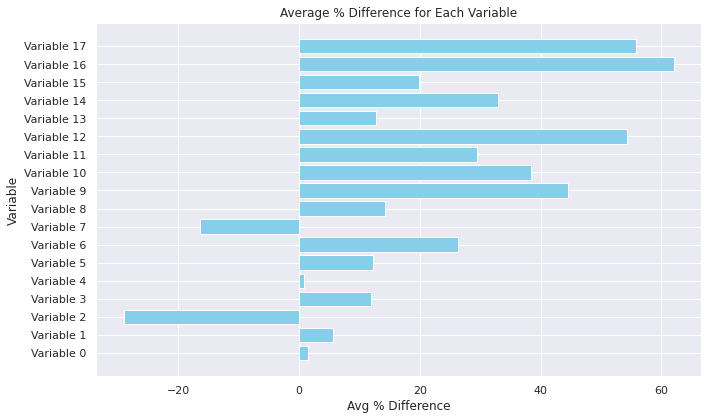


STORM INDEX: 12


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


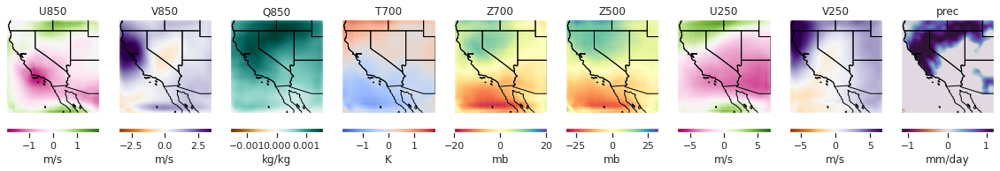

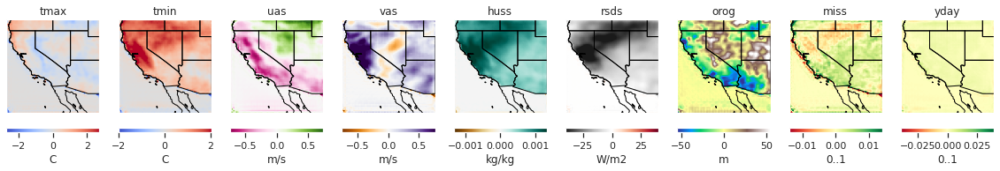

Day 12, Variable 0: Avg % Difference: -3.73
Day 12, Variable 1: Avg % Difference: 14.53
Day 12, Variable 2: Avg % Difference: -20.16
Day 12, Variable 3: Avg % Difference: 18.76
Day 12, Variable 4: Avg % Difference: 4.69
Day 12, Variable 5: Avg % Difference: 14.63
Day 12, Variable 6: Avg % Difference: 20.25
Day 12, Variable 7: Avg % Difference: 33.85
Day 12, Variable 8: Avg % Difference: 12.97
Day 12, Variable 9: Avg % Difference: 49.05
Day 12, Variable 10: Avg % Difference: 41.59
Day 12, Variable 11: Avg % Difference: 32.63
Day 12, Variable 12: Avg % Difference: 48.95
Day 12, Variable 13: Avg % Difference: 18.02
Day 12, Variable 14: Avg % Difference: 34.08
Day 12, Variable 15: Avg % Difference: 19.78
Day 12, Variable 16: Avg % Difference: 62.04
Day 12, Variable 17: Avg % Difference: 55.72


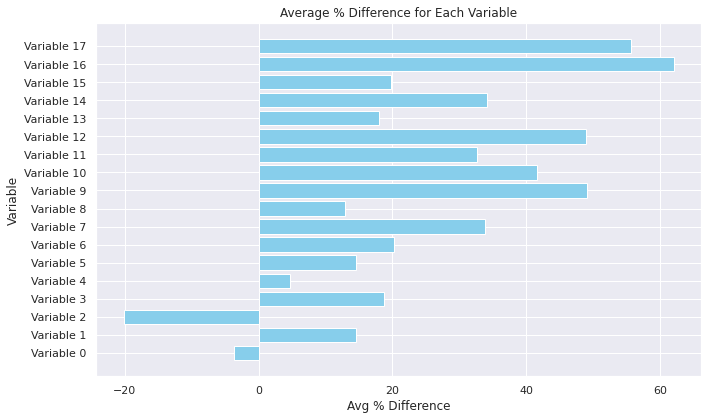


STORM INDEX: 13


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


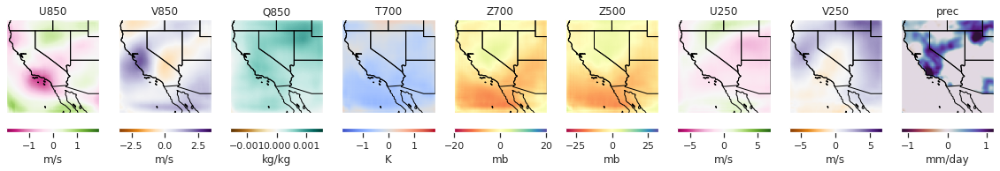

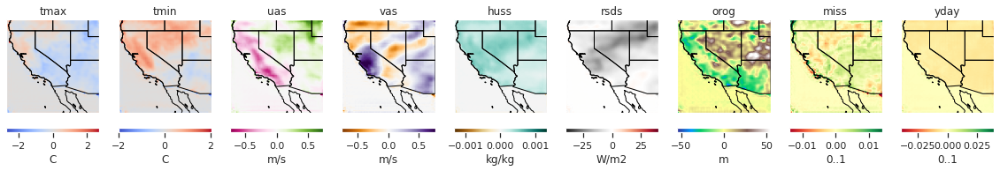

Day 13, Variable 0: Avg % Difference: 2.15
Day 13, Variable 1: Avg % Difference: 6.54
Day 13, Variable 2: Avg % Difference: -15.46
Day 13, Variable 3: Avg % Difference: 3.56
Day 13, Variable 4: Avg % Difference: 0.17
Day 13, Variable 5: Avg % Difference: 3.29
Day 13, Variable 6: Avg % Difference: 16.47
Day 13, Variable 7: Avg % Difference: 44.18
Day 13, Variable 8: Avg % Difference: 8.54
Day 13, Variable 9: Avg % Difference: 48.29
Day 13, Variable 10: Avg % Difference: 42.89
Day 13, Variable 11: Avg % Difference: 33.72
Day 13, Variable 12: Avg % Difference: 48.11
Day 13, Variable 13: Avg % Difference: 17.52
Day 13, Variable 14: Avg % Difference: 37.52
Day 13, Variable 15: Avg % Difference: 19.78
Day 13, Variable 16: Avg % Difference: 62.04
Day 13, Variable 17: Avg % Difference: 55.72


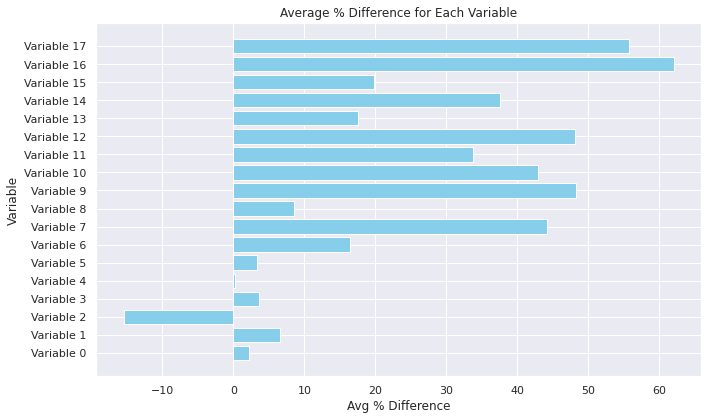


STORM INDEX: 14


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


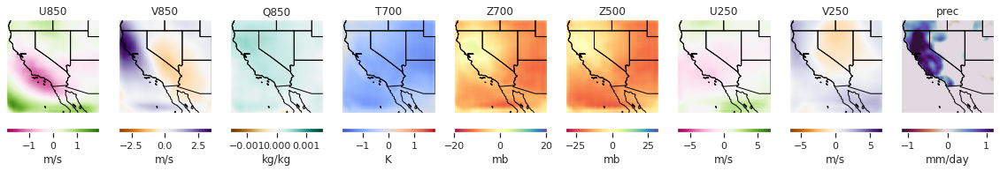

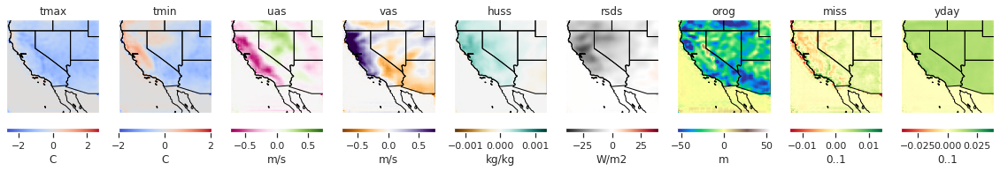

Day 14, Variable 0: Avg % Difference: -4.20
Day 14, Variable 1: Avg % Difference: 16.07
Day 14, Variable 2: Avg % Difference: -23.80
Day 14, Variable 3: Avg % Difference: -17.07
Day 14, Variable 4: Avg % Difference: -33.11
Day 14, Variable 5: Avg % Difference: -29.16
Day 14, Variable 6: Avg % Difference: 12.00
Day 14, Variable 7: Avg % Difference: 6.58
Day 14, Variable 8: Avg % Difference: 7.98
Day 14, Variable 9: Avg % Difference: 42.77
Day 14, Variable 10: Avg % Difference: 38.11
Day 14, Variable 11: Avg % Difference: 27.14
Day 14, Variable 12: Avg % Difference: 50.03
Day 14, Variable 13: Avg % Difference: 12.83
Day 14, Variable 14: Avg % Difference: 39.56
Day 14, Variable 15: Avg % Difference: 19.78
Day 14, Variable 16: Avg % Difference: 62.04
Day 14, Variable 17: Avg % Difference: 55.72


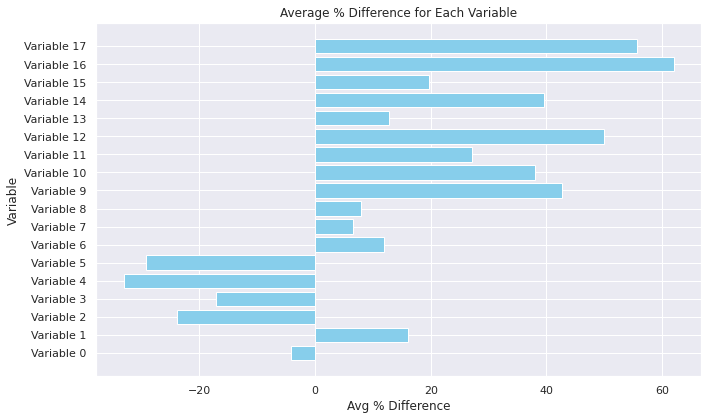


STORM INDEX: 15


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


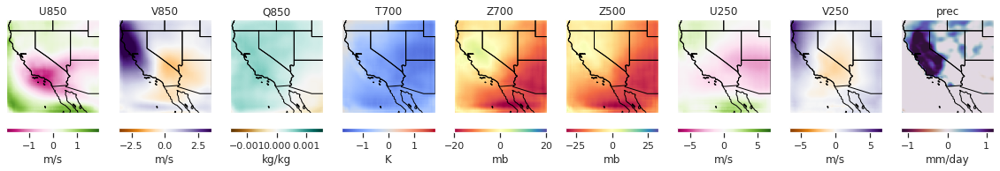

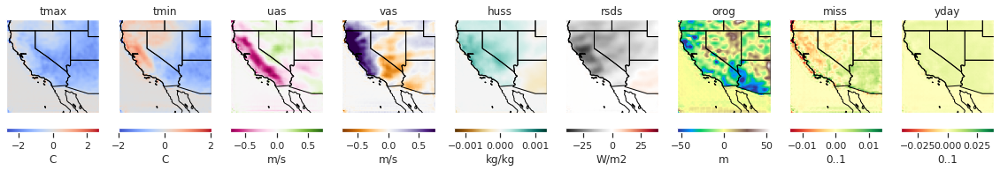

Day 15, Variable 0: Avg % Difference: 4.70
Day 15, Variable 1: Avg % Difference: 11.37
Day 15, Variable 2: Avg % Difference: -19.52
Day 15, Variable 3: Avg % Difference: -25.22
Day 15, Variable 4: Avg % Difference: -47.54
Day 15, Variable 5: Avg % Difference: -37.71
Day 15, Variable 6: Avg % Difference: 29.03
Day 15, Variable 7: Avg % Difference: -23.26
Day 15, Variable 8: Avg % Difference: 14.68
Day 15, Variable 9: Avg % Difference: 42.45
Day 15, Variable 10: Avg % Difference: 37.61
Day 15, Variable 11: Avg % Difference: 28.04
Day 15, Variable 12: Avg % Difference: 55.07
Day 15, Variable 13: Avg % Difference: 14.63
Day 15, Variable 14: Avg % Difference: 38.76
Day 15, Variable 15: Avg % Difference: 19.78
Day 15, Variable 16: Avg % Difference: 62.04
Day 15, Variable 17: Avg % Difference: 55.72


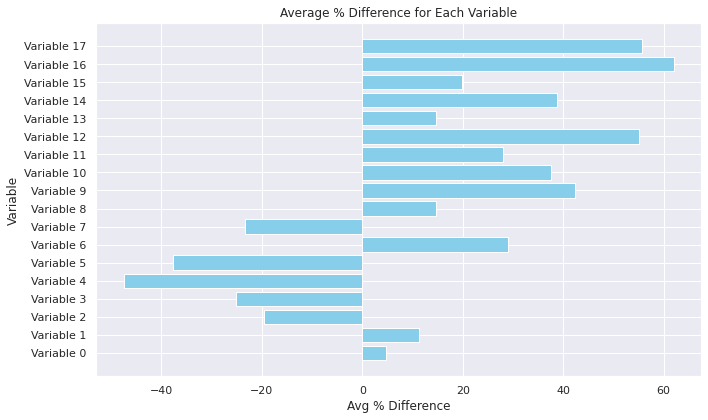


STORM INDEX: 16


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


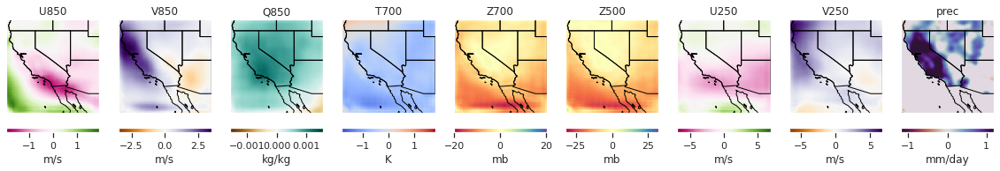

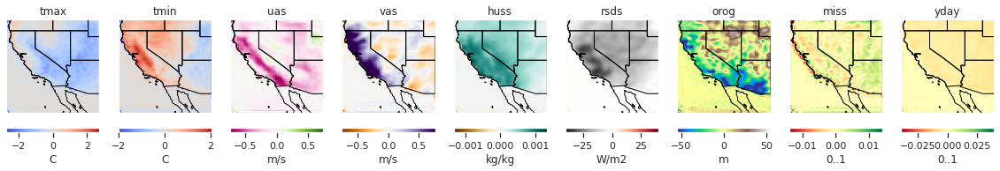

Day 16, Variable 0: Avg % Difference: 6.00
Day 16, Variable 1: Avg % Difference: 20.92
Day 16, Variable 2: Avg % Difference: -12.90
Day 16, Variable 3: Avg % Difference: -19.48
Day 16, Variable 4: Avg % Difference: -39.38
Day 16, Variable 5: Avg % Difference: -31.03
Day 16, Variable 6: Avg % Difference: 82.74
Day 16, Variable 7: Avg % Difference: -13.05
Day 16, Variable 8: Avg % Difference: 22.11
Day 16, Variable 9: Avg % Difference: 42.89
Day 16, Variable 10: Avg % Difference: 39.84
Day 16, Variable 11: Avg % Difference: 28.20
Day 16, Variable 12: Avg % Difference: 57.43
Day 16, Variable 13: Avg % Difference: 21.12
Day 16, Variable 14: Avg % Difference: 25.11
Day 16, Variable 15: Avg % Difference: 19.78
Day 16, Variable 16: Avg % Difference: 62.04
Day 16, Variable 17: Avg % Difference: 55.72


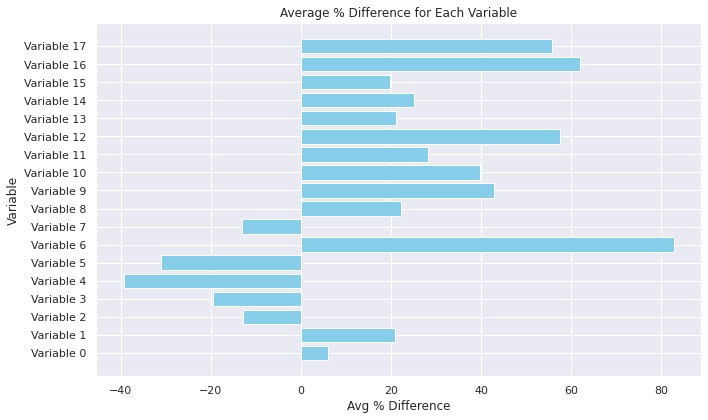


STORM INDEX: 17


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


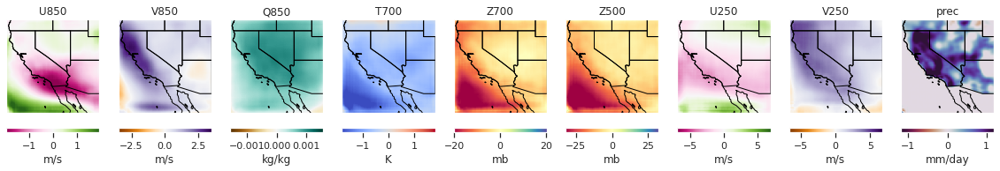

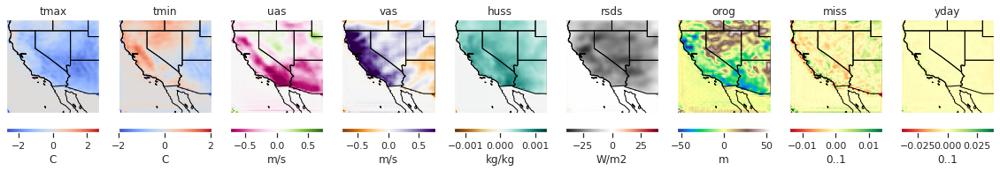

Day 17, Variable 0: Avg % Difference: -5.03
Day 17, Variable 1: Avg % Difference: 36.35
Day 17, Variable 2: Avg % Difference: -7.89
Day 17, Variable 3: Avg % Difference: -13.90
Day 17, Variable 4: Avg % Difference: -83.01
Day 17, Variable 5: Avg % Difference: -49.82
Day 17, Variable 6: Avg % Difference: 29.82
Day 17, Variable 7: Avg % Difference: 40.07
Day 17, Variable 8: Avg % Difference: 24.06
Day 17, Variable 9: Avg % Difference: 45.01
Day 17, Variable 10: Avg % Difference: 41.97
Day 17, Variable 11: Avg % Difference: 22.25
Day 17, Variable 12: Avg % Difference: 60.26
Day 17, Variable 13: Avg % Difference: 23.60
Day 17, Variable 14: Avg % Difference: 26.68
Day 17, Variable 15: Avg % Difference: 19.78
Day 17, Variable 16: Avg % Difference: 62.04
Day 17, Variable 17: Avg % Difference: 55.72


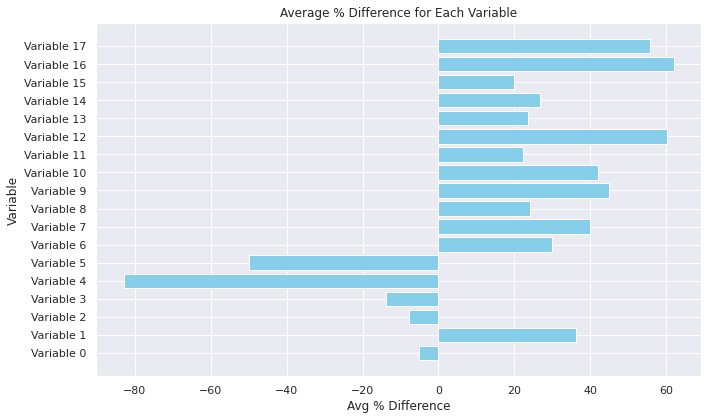


STORM INDEX: 18


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


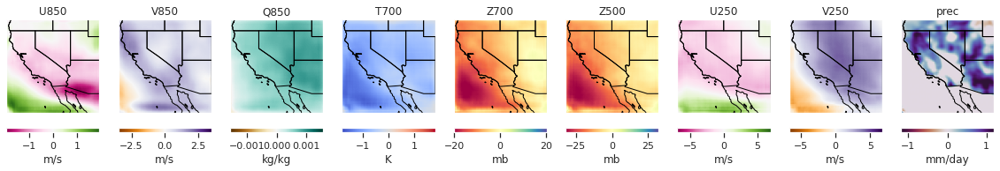

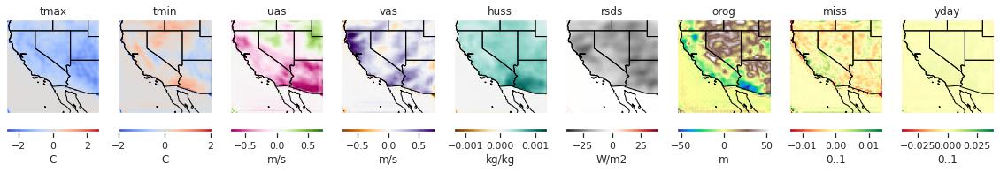

Day 18, Variable 0: Avg % Difference: 25.70
Day 18, Variable 1: Avg % Difference: 7.89
Day 18, Variable 2: Avg % Difference: -11.14
Day 18, Variable 3: Avg % Difference: -35.04
Day 18, Variable 4: Avg % Difference: -106.70
Day 18, Variable 5: Avg % Difference: -74.51
Day 18, Variable 6: Avg % Difference: -10.21
Day 18, Variable 7: Avg % Difference: 17.75
Day 18, Variable 8: Avg % Difference: 18.90
Day 18, Variable 9: Avg % Difference: 43.32
Day 18, Variable 10: Avg % Difference: 40.74
Day 18, Variable 11: Avg % Difference: 29.67
Day 18, Variable 12: Avg % Difference: 57.10
Day 18, Variable 13: Avg % Difference: 19.01
Day 18, Variable 14: Avg % Difference: 32.76
Day 18, Variable 15: Avg % Difference: 19.78
Day 18, Variable 16: Avg % Difference: 62.04
Day 18, Variable 17: Avg % Difference: 55.72


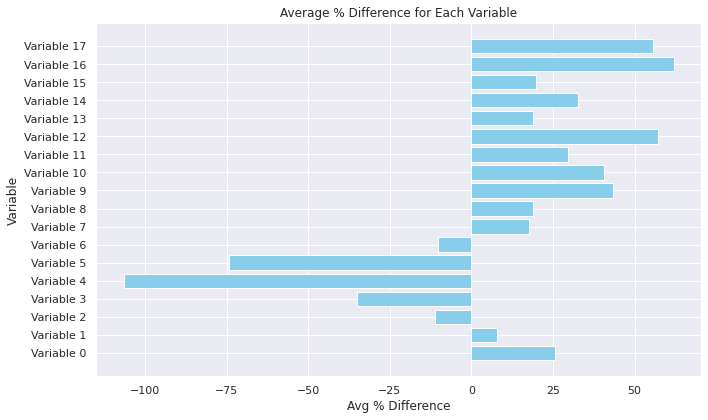


STORM INDEX: 19


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


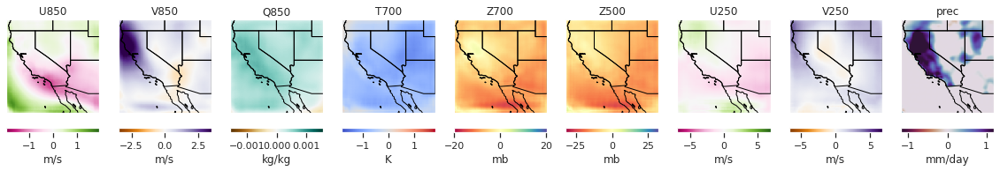

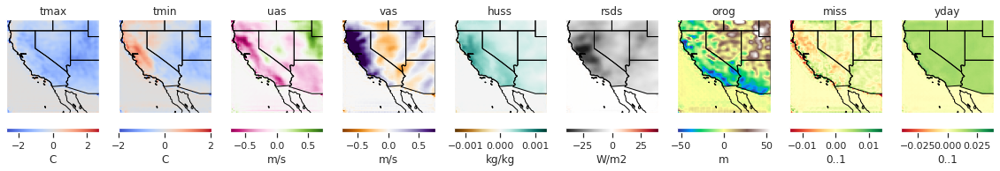

Day 19, Variable 0: Avg % Difference: 13.83
Day 19, Variable 1: Avg % Difference: 15.35
Day 19, Variable 2: Avg % Difference: -12.01
Day 19, Variable 3: Avg % Difference: -30.71
Day 19, Variable 4: Avg % Difference: -47.97
Day 19, Variable 5: Avg % Difference: -38.93
Day 19, Variable 6: Avg % Difference: 46.91
Day 19, Variable 7: Avg % Difference: -19.64
Day 19, Variable 8: Avg % Difference: 15.59
Day 19, Variable 9: Avg % Difference: 42.94
Day 19, Variable 10: Avg % Difference: 38.71
Day 19, Variable 11: Avg % Difference: 31.99
Day 19, Variable 12: Avg % Difference: 53.53
Day 19, Variable 13: Avg % Difference: 18.44
Day 19, Variable 14: Avg % Difference: 40.15
Day 19, Variable 15: Avg % Difference: 19.78
Day 19, Variable 16: Avg % Difference: 62.04
Day 19, Variable 17: Avg % Difference: 55.72


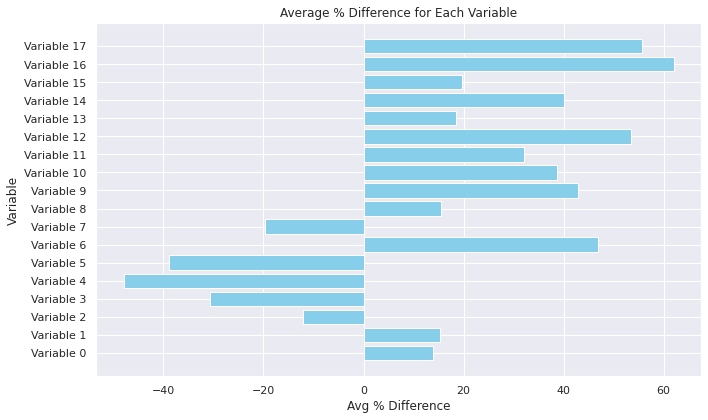


STORM INDEX: 20


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


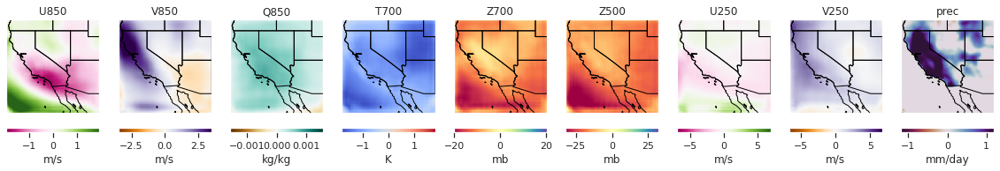

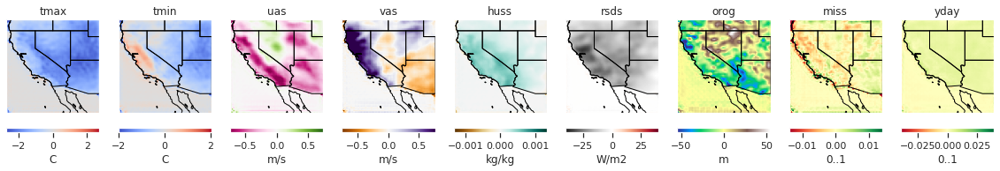

Day 20, Variable 0: Avg % Difference: -3.97
Day 20, Variable 1: Avg % Difference: 37.58
Day 20, Variable 2: Avg % Difference: -9.98
Day 20, Variable 3: Avg % Difference: -13.74
Day 20, Variable 4: Avg % Difference: -38.60
Day 20, Variable 5: Avg % Difference: -25.67
Day 20, Variable 6: Avg % Difference: 58.69
Day 20, Variable 7: Avg % Difference: 20.75
Day 20, Variable 8: Avg % Difference: 20.88
Day 20, Variable 9: Avg % Difference: 43.83
Day 20, Variable 10: Avg % Difference: 40.28
Day 20, Variable 11: Avg % Difference: 24.45
Day 20, Variable 12: Avg % Difference: 60.83
Day 20, Variable 13: Avg % Difference: 20.48
Day 20, Variable 14: Avg % Difference: 27.54
Day 20, Variable 15: Avg % Difference: 19.78
Day 20, Variable 16: Avg % Difference: 62.04
Day 20, Variable 17: Avg % Difference: 55.72


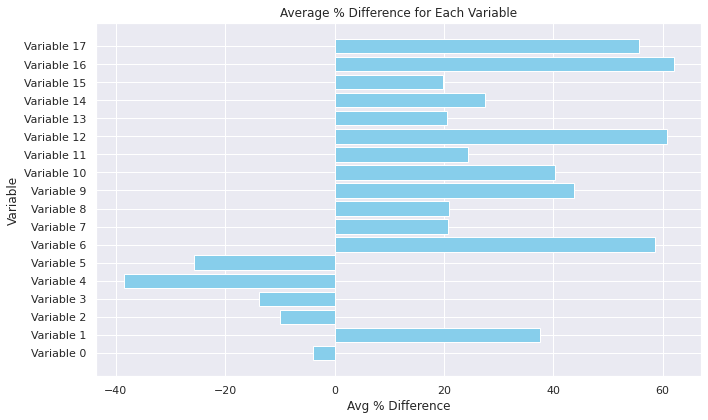


STORM INDEX: 21


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


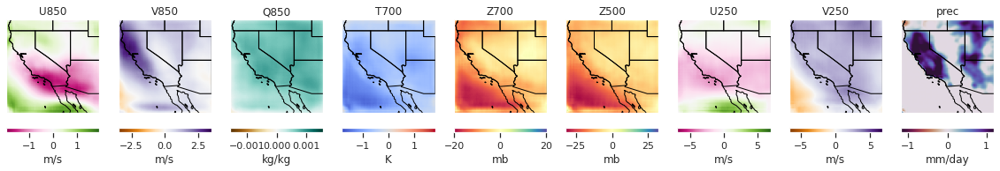

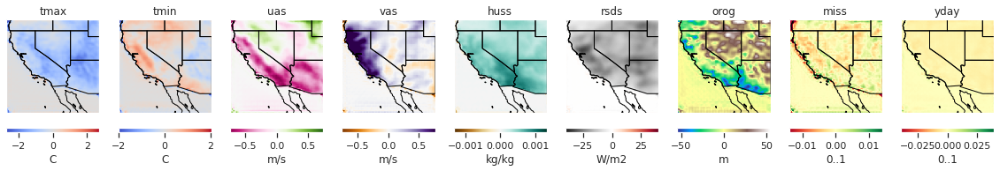

Day 21, Variable 0: Avg % Difference: 25.03
Day 21, Variable 1: Avg % Difference: 23.61
Day 21, Variable 2: Avg % Difference: -10.16
Day 21, Variable 3: Avg % Difference: -28.10
Day 21, Variable 4: Avg % Difference: -47.26
Day 21, Variable 5: Avg % Difference: -39.70
Day 21, Variable 6: Avg % Difference: 34.88
Day 21, Variable 7: Avg % Difference: 24.72
Day 21, Variable 8: Avg % Difference: 24.20
Day 21, Variable 9: Avg % Difference: 42.85
Day 21, Variable 10: Avg % Difference: 40.05
Day 21, Variable 11: Avg % Difference: 30.62
Day 21, Variable 12: Avg % Difference: 61.54
Day 21, Variable 13: Avg % Difference: 20.91
Day 21, Variable 14: Avg % Difference: 37.07
Day 21, Variable 15: Avg % Difference: 19.78
Day 21, Variable 16: Avg % Difference: 62.04
Day 21, Variable 17: Avg % Difference: 55.72


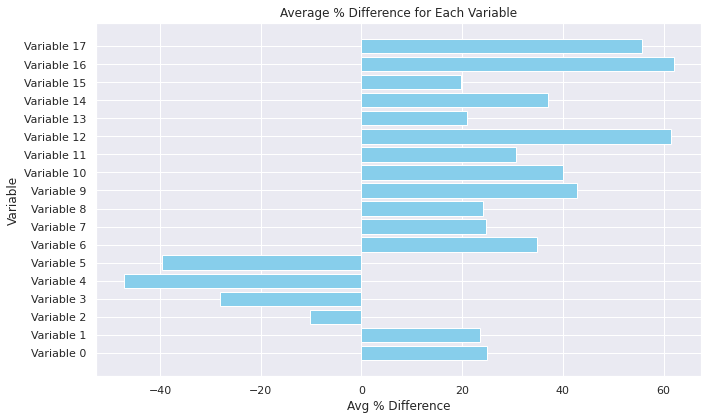


STORM INDEX: 22


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


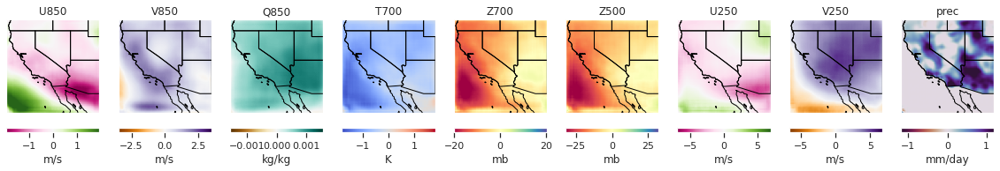

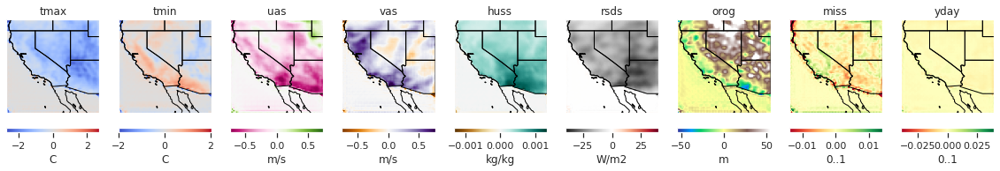

Day 22, Variable 0: Avg % Difference: 31.60
Day 22, Variable 1: Avg % Difference: 17.98
Day 22, Variable 2: Avg % Difference: -10.05
Day 22, Variable 3: Avg % Difference: -32.19
Day 22, Variable 4: Avg % Difference: -34.02
Day 22, Variable 5: Avg % Difference: -34.93
Day 22, Variable 6: Avg % Difference: 34.40
Day 22, Variable 7: Avg % Difference: 12.38
Day 22, Variable 8: Avg % Difference: 24.45
Day 22, Variable 9: Avg % Difference: 41.84
Day 22, Variable 10: Avg % Difference: 39.61
Day 22, Variable 11: Avg % Difference: 32.73
Day 22, Variable 12: Avg % Difference: 58.55
Day 22, Variable 13: Avg % Difference: 19.59
Day 22, Variable 14: Avg % Difference: 31.99
Day 22, Variable 15: Avg % Difference: 19.78
Day 22, Variable 16: Avg % Difference: 62.04
Day 22, Variable 17: Avg % Difference: 55.72


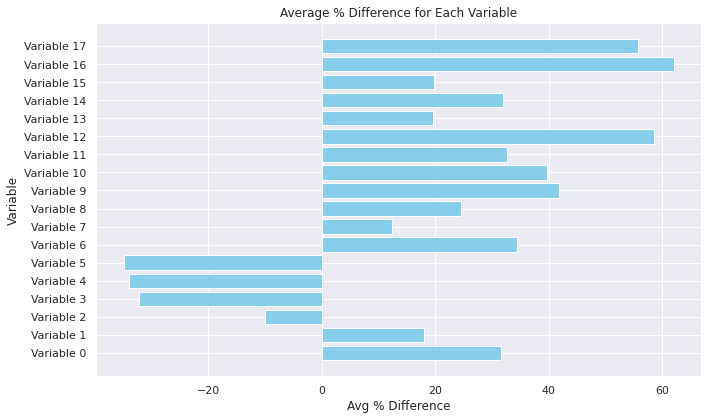


STORM INDEX: 23


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


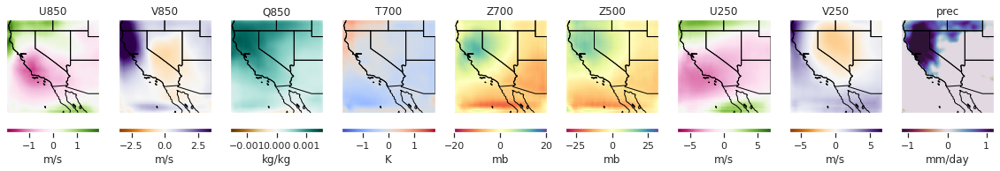

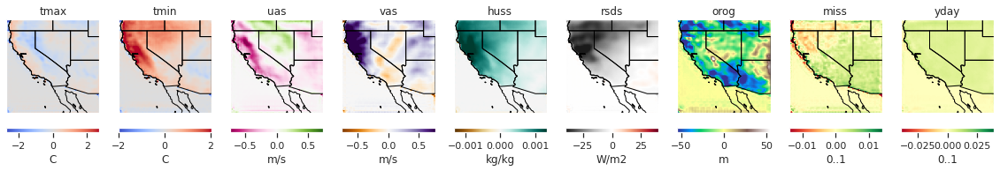

Day 23, Variable 0: Avg % Difference: -9.81
Day 23, Variable 1: Avg % Difference: 15.76
Day 23, Variable 2: Avg % Difference: -26.04
Day 23, Variable 3: Avg % Difference: 20.77
Day 23, Variable 4: Avg % Difference: 55.22
Day 23, Variable 5: Avg % Difference: 36.57
Day 23, Variable 6: Avg % Difference: -11.27
Day 23, Variable 7: Avg % Difference: -7.84
Day 23, Variable 8: Avg % Difference: 9.09
Day 23, Variable 9: Avg % Difference: 50.02
Day 23, Variable 10: Avg % Difference: 41.33
Day 23, Variable 11: Avg % Difference: 30.91
Day 23, Variable 12: Avg % Difference: 56.63
Day 23, Variable 13: Avg % Difference: 15.22
Day 23, Variable 14: Avg % Difference: 27.92
Day 23, Variable 15: Avg % Difference: 19.78
Day 23, Variable 16: Avg % Difference: 62.04
Day 23, Variable 17: Avg % Difference: 55.72


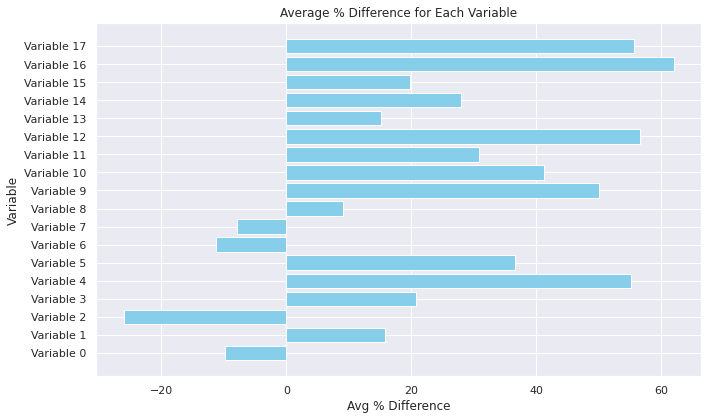


STORM INDEX: 24


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


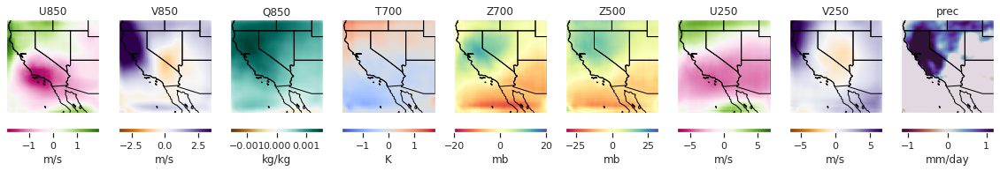

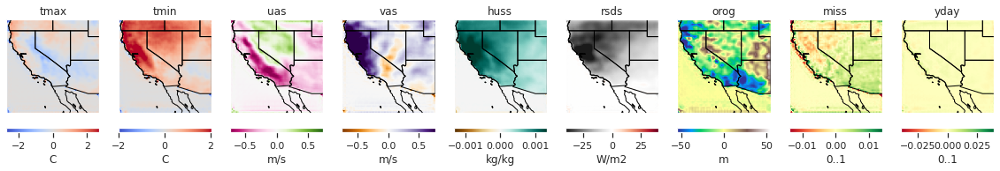

Day 24, Variable 0: Avg % Difference: 8.94
Day 24, Variable 1: Avg % Difference: 20.12
Day 24, Variable 2: Avg % Difference: -19.93
Day 24, Variable 3: Avg % Difference: 19.86
Day 24, Variable 4: Avg % Difference: 38.74
Day 24, Variable 5: Avg % Difference: 26.64
Day 24, Variable 6: Avg % Difference: 7.39
Day 24, Variable 7: Avg % Difference: 11.95
Day 24, Variable 8: Avg % Difference: 16.87
Day 24, Variable 9: Avg % Difference: 49.17
Day 24, Variable 10: Avg % Difference: 42.82
Day 24, Variable 11: Avg % Difference: 31.12
Day 24, Variable 12: Avg % Difference: 59.99
Day 24, Variable 13: Avg % Difference: 18.93
Day 24, Variable 14: Avg % Difference: 16.71
Day 24, Variable 15: Avg % Difference: 19.78
Day 24, Variable 16: Avg % Difference: 62.04
Day 24, Variable 17: Avg % Difference: 55.72


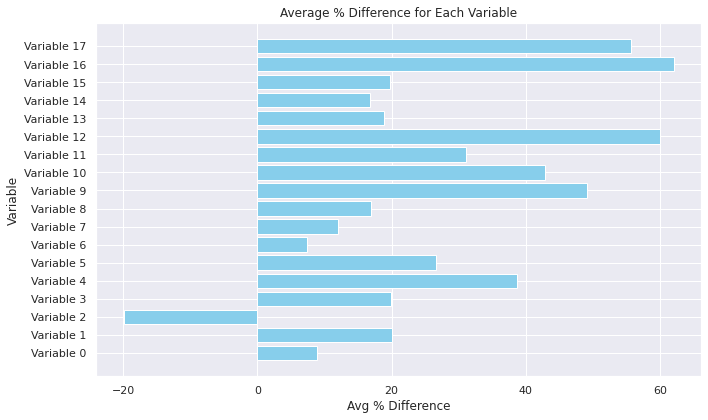


STORM INDEX: 25


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:55: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [185, 232, 62, 127, 21, 74]


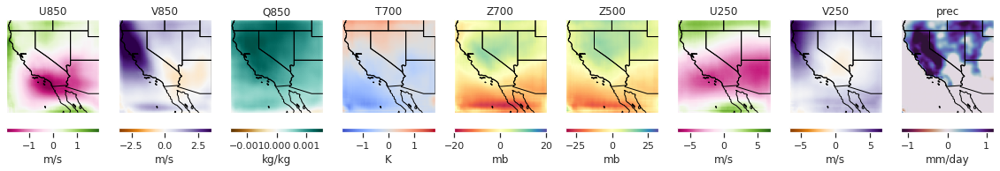

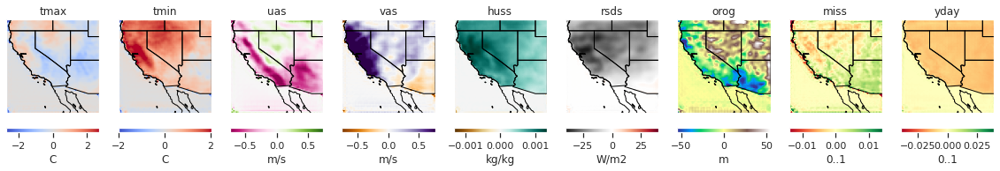

Day 25, Variable 0: Avg % Difference: 21.13
Day 25, Variable 1: Avg % Difference: 34.14
Day 25, Variable 2: Avg % Difference: -13.05
Day 25, Variable 3: Avg % Difference: 19.17
Day 25, Variable 4: Avg % Difference: 3.06
Day 25, Variable 5: Avg % Difference: 13.29
Day 25, Variable 6: Avg % Difference: 19.08
Day 25, Variable 7: Avg % Difference: -0.24
Day 25, Variable 8: Avg % Difference: 24.73
Day 25, Variable 9: Avg % Difference: 50.15
Day 25, Variable 10: Avg % Difference: 44.10
Day 25, Variable 11: Avg % Difference: 38.70
Day 25, Variable 12: Avg % Difference: 65.54
Day 25, Variable 13: Avg % Difference: 22.46
Day 25, Variable 14: Avg % Difference: 12.50
Day 25, Variable 15: Avg % Difference: 19.78
Day 25, Variable 16: Avg % Difference: 62.04
Day 25, Variable 17: Avg % Difference: 55.72


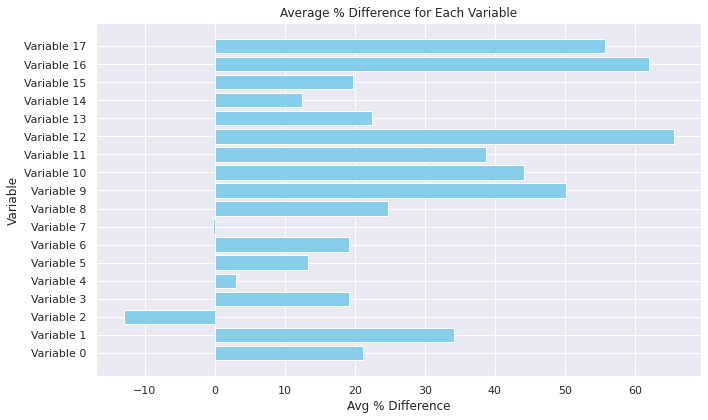

([-1.9315390134848012,
  -2.2428989308014944,
  -0.0001078265330054997,
  -1.8181514108966574,
  -20.271422524290955,
  -32.434792123948775,
  -6.89195411130172,
  -3.615020370226795,
  -0.6412443858233468,
  -2.7356955200900153,
  -1.493837523444762,
  -0.7493102045527134,
  -0.5139218804164317,
  -0.00046044575855648214,
  -40.417482889378945,
  -54.59726343060903,
  -0.013662256132480458,
  -0.03614845885452357],
 [1.5628620122173245,
  3.4995771957465855,
  0.0015897844419795186,
  0.808390884336788,
  12.914216742427357,
  24.02938987586002,
  4.754444732946548,
  6.707520150903487,
  1.192078410206088,
  0.8638261699527721,
  2.0268369437342093,
  0.4458968867065112,
  0.7643641172423593,
  0.0013378421002323616,
  15.897841946964022,
  52.28111139301589,
  0.014052715493405626,
  0.039769208922209934],
 tensor([0.1859, 0.2856, 0.4837, 0.2205, 0.1374, 0.2041, 0.2904, 0.3116, 0.5887,
         0.4031, 0.4919, 0.4436, 0.2885, 0.3285, 0.2385, 0.8745, 0.7272, 0.2841,
         0.2189, 

In [2807]:
#apply_filter_substitutions(storms, [0, 1, 2], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
vmin,vmax = get_filter_substitutions_minmax(storms, [185, 232, 62, 127, 21, 74], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26)
apply_filter_substitutions(storms, [185, 232, 62, 127, 21, 74], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26, vmin=vmin, vmax=vmax)

#apply_filter_substitutions(storms, [111, 7, 81, 94, 241, 39, 141, 100, 29, 12, 125, 70, 162, 222, 240, 183, 185, 231, 236, 87, 47, 119, 48, 82, 107, 101, 113, 74, 91, 23, 128, 126, 173, 202, 220, 36, 57, 242, 83, 175, 127, 164, 146, 234, 33, 174, 195, 212, 15, 21, 201, 215, 79, 157, 177, 11, 142, 85, 88, 253, 32, 151, 192, 92, 136, 77, 40, 67, 147, 163, 114, 211, 102, 224]
#, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)


In [2644]:
# #apply_filter_substitutions(storms, [0, 1, 2], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
# vmax,vmin = apply_filter_substitutions(storms, [161, 248, 41, 76], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 1)
# apply_filter_substitutions(storms, [161, 248, 41, 76], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26, vmin=vmin, vmax=vmax)

# #apply_filter_substitutions(storms, [111, 7, 81, 94, 241, 39, 141, 100, 29, 12, 125, 70, 162, 222, 240, 183, 185, 231, 236, 87, 47, 119, 48, 82, 107, 101, 113, 74, 91, 23, 128, 126, 173, 202, 220, 36, 57, 242, 83, 175, 127, 164, 146, 234, 33, 174, 195, 212, 15, 21, 201, 215, 79, 157, 177, 11, 142, 85, 88, 253, 32, 151, 192, 92, 136, 77, 40, 67, 147, 163, 114, 211, 102, 224]
# #, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)


In [2641]:
# #apply_filter_substitutions(storms, [0, 1, 2], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
# vmax,vmin = apply_filter_substitutions(storms, [9, 38, 158], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 1)
# apply_filter_substitutions(storms, [9, 38, 158], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26, vmin=vmin, vmax=vmax)

# #apply_filter_substitutions(storms, [111, 7, 81, 94, 241, 39, 141, 100, 29, 12, 125, 70, 162, 222, 240, 183, 185, 231, 236, 87, 47, 119, 48, 82, 107, 101, 113, 74, 91, 23, 128, 126, 173, 202, 220, 36, 57, 242, 83, 175, 127, 164, 146, 234, 33, 174, 195, 212, 15, 21, 201, 215, 79, 157, 177, 11, 142, 85, 88, 253, 32, 151, 192, 92, 136, 77, 40, 67, 147, 163, 114, 211, 102, 224]
# #, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)


In [2638]:
# #apply_filter_substitutions(storms, [0, 1, 2], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
# vmax,vmin = apply_filter_substitutions(storms, [247, 75, 20, 96, 116, 133, 210], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 1)
# apply_filter_substitutions(storms, [247, 75, 20, 96, 116, 133, 210], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26, vmin=vmin, vmax=vmax)

# #apply_filter_substitutions(storms, [111, 7, 81, 94, 241, 39, 141, 100, 29, 12, 125, 70, 162, 222, 240, 183, 185, 231, 236, 87, 47, 119, 48, 82, 107, 101, 113, 74, 91, 23, 128, 126, 173, 202, 220, 36, 57, 242, 83, 175, 127, 164, 146, 234, 33, 174, 195, 212, 15, 21, 201, 215, 79, 157, 177, 11, 142, 85, 88, 253, 32, 151, 192, 92, 136, 77, 40, 67, 147, 163, 114, 211, 102, 224]
# #, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
